In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

import torch
from torch.optim import Adam
import torch.nn as nn
import torch.nn.functional as F_
from torch.utils.data import DataLoader, TensorDataset

import torchvision
from torchvision import models
from torchvision import datasets, transforms
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
from torchvision.ops import box_iou
from torchvision.ops import nms
from torchvision.ops import MultiScaleRoIAlign
from torchvision.utils import draw_bounding_boxes
from torchvision.models import resnet18, ResNet18_Weights
from torchvision.models import vgg16, VGG16_Weights
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.segmentation import deeplabv3_resnet101, DeepLabV3_ResNet101_Weights
import torchvision.utils as vutils

from torchmetrics.image.fid import FrechetInceptionDistance

from backbones_unet.model.unet import Unet

from PIL import Image

C:\Users\Alienware\miniconda3\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Binary classification model

As a deep learning practitioner, one of your main tasks is training models for image classification. You often encounter binary classification, where you need to distinguish between two classes. To streamline your workflow and ensure reusability, you have decided to create a template for a binary image classification CNN model, which can be applied to future projects.

In [2]:
class BinaryImageClassifier(nn.Module):
    def __init__(self):
        super(BinaryImageClassifier, self).__init__()
        
        # Create a convolutional layer
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1,padding=1)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = nn.Flatten()
        
        # Create a fully connected layer
        self.fc = nn.Linear(16*32*32,1)
        
        # Create an activation function
        self.sigmoid = nn.Sigmoid()

# Notice that the fully connected (fc) layer has an input size of 16x32x32. This is due to the original image input size being 64x64. 
# After passing through the max pooling layer, the spatial dimensions are reduced in half, resulting in 32x32

Multi-class classification model

With a template for a binary classification model in place, you can now build on it to design a multi-class classification model. The model should handle different numbers of classes via a parameter, allowing you to tailor the model to a specific multi-class classification task in the future.

In [3]:
class MultiClassImageClassifier(nn.Module):
  
    # Define the init method
    def __init__(self, num_classes):
        super(MultiClassImageClassifier, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = nn.Flatten()

        # Create a fully connected layer
        self.fc = nn.Linear(16*32*32, num_classes)
        
        # Create an activation function
        self.softmax = nn.Softmax(dim=1)

# dim=1 indicates that the softmax should be applied along the second dimension (the dimension corresponding to the number of classes in the output). 
# This is important because it ensures that the output of the softmax function represents probabilities for each class for a given input sample.

RGB, grayscale, or alpha?

Your team obtained a new image dataset for training. Before designing a model, you want to check if the images are RGB, grayscale, or with a transparency alpha channel. Assuming all the images in the dataset are the same, you only need to check one sample image.

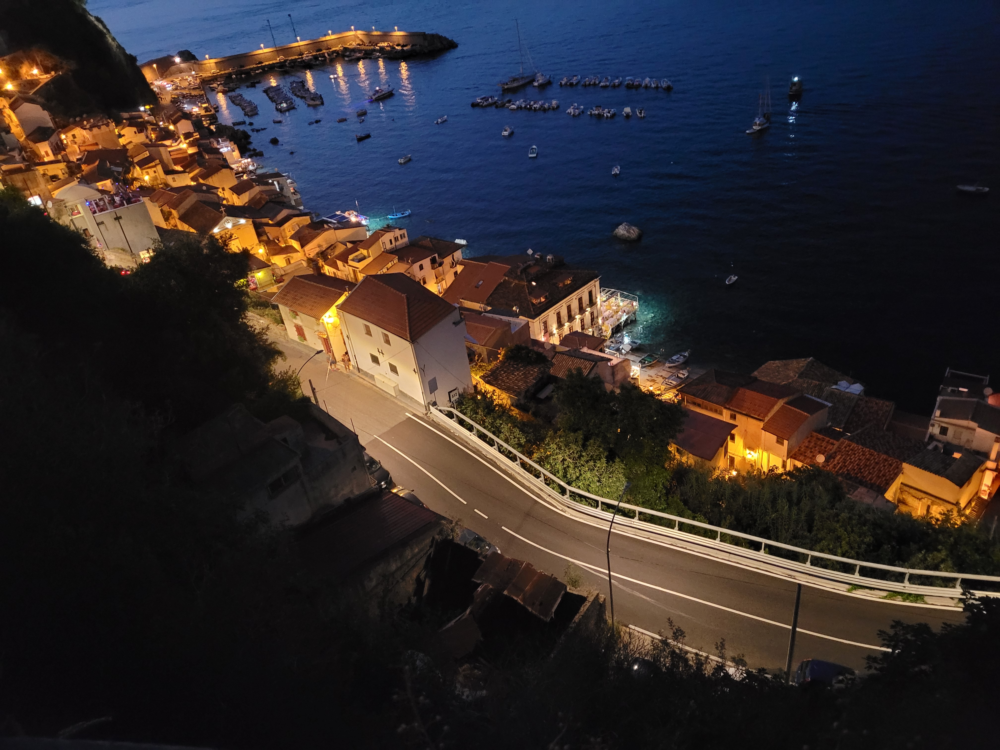

In [4]:
img = Image.open('image.jpg')
img

In [5]:
F.get_image_num_channels(img)

3

Adding a new convolutional layer

Your project lead provided you with a new CNN model. Let's take a look at the model's architecture and append a new convolutional layer to it.

In [6]:
class CNNModel(nn.Module):
  
    # Define the init method
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)

In [7]:
# Create a model
model = CNNModel()
print("Original model: ", model)

Original model:  CNNModel(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


In [8]:
# Create a new convolutional layer
conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1)
conv2


Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [9]:
# Append the new layer to the model
model.add_module("conv2", conv2)
print("Extended model: ", model)

Extended model:  CNNModel(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


Creating a sequential block

You decided to redesign your binary CNN model template by creating a block of convolutional layers. This will help you stack multiple layers sequentially. With this improved model, you will be able to easily design various CNN architectures.

In [10]:
class BinaryImageClassification(nn.Module):
  def __init__(self):
    super(BinaryImageClassification, self).__init__()
    # Create a convolutional block
    self.conv_block = nn.Sequential(
      nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
      nn.ReLU(),
      nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
      nn.ReLU(),
    )
    
  def forward(self, x):
    # Pass inputs through the convolutional block
    x = self.conv_block(x)
    return x

Save and load a model

A manufacturing company wants to classify their projects based on images and determine the appropriate shipping packaging. Having trained a highly accurate model in PyTorch, you now plan to save the model and its pre-trained weights for future use and to share it with your team, making sure they can seamlessly load it.

In [11]:
class ManufacturingCNN(nn.Module):
    def __init__(self):
        super(ManufacturingCNN, self).__init__()
        # Defining the convolutional layer
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        
        # Activation function
        self.relu = nn.ReLU()
        
        # Pooling layer
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layer
        self.fc1 = nn.Linear(16 * 32 * 32, 4)  # Assuming input image size is 64x64

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        # Flatten the input for the fully connected layer
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.fc1(x)
        
        return x


In [12]:
# Create a model instance
model = ManufacturingCNN()
print("Model architecture:\n", model)

Model architecture:
 ManufacturingCNN(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=16384, out_features=4, bias=True)
)


In [13]:
model.state_dict().keys()

odict_keys(['conv1.weight', 'conv1.bias', 'fc1.weight', 'fc1.bias'])

In [14]:
# Save the model
torch.save(model.state_dict(), 'ModelCNN.pth')

In [15]:
# Create a new model
loaded_model = ManufacturingCNN()
loaded_model

ManufacturingCNN(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=16384, out_features=4, bias=True)
)

In [16]:
# Load the saved model
loaded_model.load_state_dict(torch.load('ModelCNN.pth'))
print(loaded_model)

ManufacturingCNN(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=16384, out_features=4, bias=True)
)


C:\Users\Alienware\AppData\Local\Temp\ipykernel_26172\3823366126.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_model.load_state_dict(torch.load('ModelCNN.pth'))

Loading a pre-trained model

You are building an application to label images from the social media. This task requires high accuracy and speed. You are going to use a pre-trained ResNet18 model to infer image classes.

In [17]:
# Initialize model with default weights
weights = ResNet18_Weights.DEFAULT
weights

ResNet18_Weights.IMAGENET1K_V1

In [18]:
model = resnet18(weights=weights)

# Set model to evaluation mode
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [19]:
# Initialize the transforms
transform = weights.transforms()
transform

# The values you see in the transform object (crop size, resize size, mean, std, and interpolation) are defined as part of the ResNet18_Weights.DEFAULT configuration.
# When you set weights = ResNet18_Weights.DEFAULT, you are loading a set of pre-defined weights and transformations that are recommended for the ResNet18 model. 
# These weights typically include the necessary transformations to preprocess the input images in a way that the model expects. 
# This ensures that the images are normalized and formatted correctly before they are fed into the network.

# crop_size=[224]: This specifies the crop size for the images. The images will be cropped to 224x224 pixels.
# resize_size=[256]: This specifies the resize size for the images. The images will be resized to 256x256 pixels before cropping.
# mean=[0.485, 0.456, 0.406]: These values are the mean normalization values for the RGB channels. They are typically used to normalize the pixel values of the image.
# std=[0.229, 0.224, 0.225]: These values are the standard deviation normalization values for the RGB channels. They are used along with the mean to normalize the pixel values.
# interpolation=InterpolationMode.BILINEAR: This specifies the interpolation method used for resizing. In this case, bilinear interpolation is used.


ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

Image classification with ResNet

You have created the model from the pre-trained ResNet18. Now, it is time to test it on an example image.

You are going to apply preprocessing transforms to an image and classify it. You will need to use the softmax() layer followed by the argmax(), since ResNet18 has been trained on a multi-class dataset.

In [20]:
# Apply preprocessing transforms
batch = transform(img).unsqueeze(0)
batch.shape

torch.Size([1, 3, 224, 224])

In [21]:
# Apply model with softmax layer
prediction = model(batch).squeeze(0).softmax(0)
prediction.shape

# the 1000 output features in the final layer of ResNet correspond to the 1000 classes in the ImageNet dataset (that's why 1000 predictions) 
# When you use ResNet for other classification tasks, you typically modify this layer to match the number of classes in your dataset.

torch.Size([1000])

In [22]:
# Apply argmax
class_id = prediction.argmax().item()
class_id

978

In [23]:
score = prediction[class_id].item()
score

0.16094064712524414

In [24]:
weights.meta["categories"][:10]

['tench',
 'goldfish',
 'great white shark',
 'tiger shark',
 'hammerhead',
 'electric ray',
 'stingray',
 'cock',
 'hen',
 'ostrich']

In [25]:
category_name = weights.meta["categories"][class_id]
print(category_name)

seashore


Image tensors

A coffee company has an object detection project where they need to annotate objects of interest, in this case, espresso shots. You have created a list with the bounding box coordinates for an espresso shot image. Now, you need to convert the image and the coordinates into tensors.

torch and torchvision have been imported. torchvision.transforms is imported as transforms. The image has been loaded as image using Image.open() from PIL library. The bounding box coordinates are stored in the variable bbox.

In [26]:
bbox = [10, 10, 200, 200]

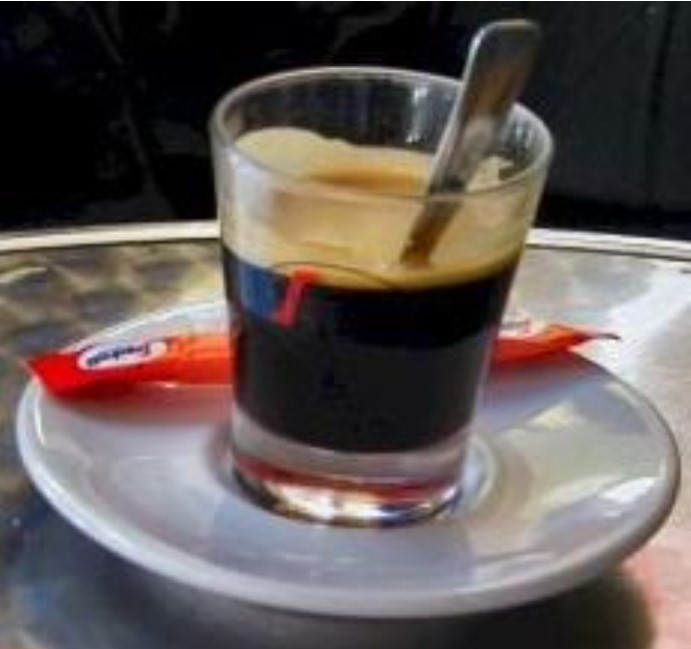

In [27]:
image = Image.open('coffee.jpg')
image

In [28]:
# Convert bbox into tensors
bbox_tensor = torch.tensor(bbox)

bbox_tensor

tensor([ 10,  10, 200, 200])

In [29]:
# Add a new batch dimension
bbox_tensor = bbox_tensor.unsqueeze(0)

bbox_tensor

tensor([[ 10,  10, 200, 200]])

In [30]:
# Resize the image and transform to tensor
transform = transforms.Compose([
  transforms.PILToTensor(),
  transforms.Resize(224)
])

# Apply transform to image
image_tensor = transform(image)
print(image_tensor.shape)
image_tensor

torch.Size([3, 224, 238])


tensor([[[ 66,  66,  66,  ...,  83,  84,  83],
         [  0,   0,   0,  ...,  24,  26,  25],
         [  0,   0,   0,  ...,  25,  26,  26],
         ...,
         [131, 131, 130,  ..., 222, 222, 223],
         [131, 132, 131,  ..., 227, 227, 228],
         [132, 133, 133,  ..., 229, 229, 230]],

        [[ 67,  67,  67,  ...,  87,  88,  88],
         [  1,   1,   1,  ...,  29,  31,  30],
         [  1,   1,   1,  ...,  30,  31,  31],
         ...,
         [122, 123, 122,  ..., 177, 176, 176],
         [120, 122, 121,  ..., 182, 182, 182],
         [121, 122, 122,  ..., 184, 184, 183]],

        [[ 70,  70,  70,  ...,  90,  91,  90],
         [  5,   5,   5,  ...,  32,  34,  33],
         [  5,   5,   5,  ...,  33,  34,  34],
         ...,
         [123, 123, 121,  ..., 172, 171, 170],
         [120, 121, 119,  ..., 177, 177, 176],
         [119, 119, 118,  ..., 179, 178, 178]]], dtype=torch.uint8)

Drawing a bounding box

Having prepared the image and bounding box tensors, you can now draw the box on top of the image and visually inspect its accuracy.

In [31]:
y_max=180
x_max=190
y_min=17
x_min=70

In [32]:
# Define the bounding box coordinates
bbox = [x_min, y_min, x_max, y_max]
bbox

[70, 17, 190, 180]

In [33]:
bbox_tensor = torch.tensor(bbox).unsqueeze(0)
print(bbox_tensor.shape)
bbox_tensor

torch.Size([1, 4])


tensor([[ 70,  17, 190, 180]])

In [34]:
# Implement draw_bounding_boxes
img_bbox = draw_bounding_boxes(image_tensor, bbox_tensor, width=3, colors="red")
print(img_bbox.shape)
img_bbox

torch.Size([3, 224, 238])


tensor([[[ 66,  66,  66,  ...,  83,  84,  83],
         [  0,   0,   0,  ...,  24,  26,  25],
         [  0,   0,   0,  ...,  25,  26,  26],
         ...,
         [131, 131, 130,  ..., 222, 222, 223],
         [131, 132, 131,  ..., 227, 227, 228],
         [132, 133, 133,  ..., 229, 229, 230]],

        [[ 67,  67,  67,  ...,  87,  88,  88],
         [  1,   1,   1,  ...,  29,  31,  30],
         [  1,   1,   1,  ...,  30,  31,  31],
         ...,
         [122, 123, 122,  ..., 177, 176, 176],
         [120, 122, 121,  ..., 182, 182, 182],
         [121, 122, 122,  ..., 184, 184, 183]],

        [[ 70,  70,  70,  ...,  90,  91,  90],
         [  5,   5,   5,  ...,  32,  34,  33],
         [  5,   5,   5,  ...,  33,  34,  34],
         ...,
         [123, 123, 121,  ..., 172, 171, 170],
         [120, 121, 119,  ..., 177, 177, 176],
         [119, 119, 118,  ..., 179, 178, 178]]], dtype=torch.uint8)

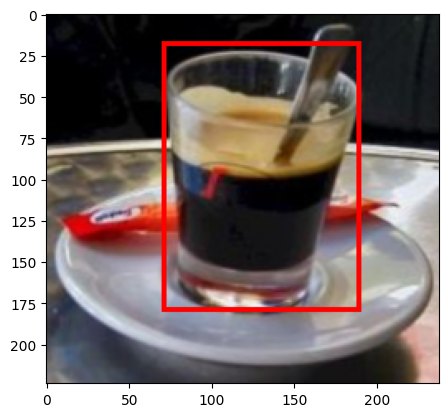

In [35]:
# Tranform tensors to image
transform = transforms.Compose([
    transforms.ToPILImage()
])

plt.imshow(transform(img_bbox))
plt.show()

Calculate IoU

You have been asked to calculate the Intersection over Union (IoU) metric between each of the three predicted bounding boxes (box_a,box_b,box_c) and the ground truth box bbox.

Which predicted box is the closest to the ground truth?

In [36]:
box_a = torch.tensor([[10, 10, 50, 50]], dtype=torch.int32)
box_b = torch.tensor([[30, 30, 70, 70]], dtype=torch.int32)
box_c = torch.tensor([[28, 15, 62, 55]], dtype=torch.int32)

In [37]:
bbox = torch.tensor([[30, 20, 60, 50]], dtype=torch.int32)
bbox

tensor([[30, 20, 60, 50]], dtype=torch.int32)

In [38]:
box_iou(box_a,bbox)

tensor([[0.3158]])

In [39]:
box_iou(box_b,bbox)

tensor([[0.3158]])

In [40]:
box_iou(box_c,bbox)

tensor([[0.6618]])

In [41]:
torch.rand(5,4)

tensor([[0.0276, 0.0953, 0.8279, 0.4847],
        [0.9137, 0.5648, 0.5195, 0.6517],
        [0.6601, 0.1601, 0.8952, 0.3092],
        [0.4662, 0.2777, 0.2610, 0.6130],
        [0.1303, 0.9952, 0.0965, 0.5147]])

In [42]:
torch.FloatTensor([random.uniform(0.7, 1) for _ in range(5)])

tensor([0.7724, 0.8285, 0.7636, 0.9941, 0.9205])

In [43]:
torch.LongTensor([random.randint(1, 3) for _ in range(5)])

tensor([1, 1, 1, 1, 3])

In [44]:
def model(image): # just a simulation of a model predicting boxes, scores and labels (with random values)
    # Simulate the behavior of a model prediction
    num_predictions = 5
    random_boxes = torch.rand(num_predictions, 4)
    random_scores = torch.FloatTensor([random.uniform(0, 1) for _ in range(num_predictions)])
    random_labels = torch.LongTensor([random.randint(1, 3) for _ in range(num_predictions)])
    prediction_output = [
        {
            'boxes': random_boxes,
            'scores': random_scores,
            'labels': random_labels
        }
    ]    
    return prediction_output

In [45]:
test_image = 0
model(0) # no need to pass the image as input, because the model predicts random values

[{'boxes': tensor([[0.0728, 0.8571, 0.3607, 0.5345],
          [0.0598, 0.9580, 0.2935, 0.5851],
          [0.8433, 0.5665, 0.5904, 0.6744],
          [0.6789, 0.5746, 0.3872, 0.4054],
          [0.3143, 0.0102, 0.9659, 0.3748]]),
  'scores': tensor([0.7937, 0.6092, 0.1544, 0.5611, 0.9062]),
  'labels': tensor([2, 1, 2, 1, 2])}]

In [46]:
# Get model's prediction
with torch.no_grad():
    output = model(test_image)

# Extract boxes from the output
boxes = output[0]['boxes']

# Extract scores from the output
scores = output[0]['scores']

print(boxes, scores)

tensor([[0.3495, 0.9171, 0.9476, 0.0466],
        [0.4075, 0.6154, 0.6296, 0.4420],
        [0.8203, 0.7114, 0.1067, 0.3755],
        [0.2567, 0.5485, 0.2031, 0.6843],
        [0.4997, 0.6201, 0.9875, 0.2388]]) tensor([0.6891, 0.4826, 0.5320, 0.3797, 0.6423])


Calculate NMS

Having extracted the predicted bounding boxes and scores from your object recognition model, your next task is to ensure that only the most accurate and non-overlapping predicted bounding boxes are retained by using the non-max suppression technique.

In [47]:
# Set the IoU threshold
iou_threshold = 0.5

# Apply non-max suppression
box_indices = nms(boxes, scores, iou_threshold)

box_indices

tensor([0, 4, 2, 1, 3])

In [48]:
# Filter boxes
filtered_boxes = boxes[box_indices]

print("Filtered Boxes:", filtered_boxes)

Filtered Boxes: tensor([[0.3495, 0.9171, 0.9476, 0.0466],
        [0.4997, 0.6201, 0.9875, 0.2388],
        [0.8203, 0.7114, 0.1067, 0.3755],
        [0.4075, 0.6154, 0.6296, 0.4420],
        [0.2567, 0.5485, 0.2031, 0.6843]])


Pre-trained model backbone

It's time to build an R-CNN architecture! You will use the vgg16 pre-trained model's backbone for feature extraction. You also remember to store the output shape of the backbone which will serve as the input shape for the subsequent blocks: the classifier and the box regressor.

In [49]:
# Load pretrained weights
vgg_model = vgg16(weights=VGG16_Weights)

vgg_model

C:\Users\Alienware\miniconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [50]:
vgg_model.classifier

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)

In [51]:
 nn.Sequential(*list(vgg_model.classifier.children()))

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)

In [52]:
nn.Sequential(*list(vgg_model.classifier.children()))[0]

Linear(in_features=25088, out_features=4096, bias=True)

In [53]:
# Extract the input dimension
input_dim = nn.Sequential(*list(vgg_model.classifier.children()))[0].in_features

input_dim

25088

In [54]:
# Create a backbone with convolutional layers
backbone = nn.Sequential(*list(vgg_model.features.children()))

# Print the backbone model
print(backbone)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

Classifier block

Your next task is to create a classifier block that will replace the original VGG16 classifier. You decide to use a block with two fully connected layers with a ReLU activation in between.

In [55]:
# Create a variable with the number of classes
num_classes = 2
    
# Create a sequential block
classifier = nn.Sequential(
	# Create a linear layer with input features
	nn.Linear(input_dim, 512),
	nn.ReLU(),
	# Add the output dimension to the classifier
	nn.Linear(512, num_classes),
)

classifier

Sequential(
  (0): Linear(in_features=25088, out_features=512, bias=True)
  (1): ReLU()
  (2): Linear(in_features=512, out_features=2, bias=True)
)

Box regressor block

Your final task is to create a regressor block to predict bounding box coordinates. You decide to have a block with 2 fully connected layers with a ReLU activation in between, similar to the classifier you defined earlier.

In [56]:
# Define the number of coordinates
num_coordinates = 4

bb = nn.Sequential(  
	# Add input and output dimensions
	nn.Linear(input_dim, 32),
	nn.ReLU(),
	# Add the output for the last regression layer
	nn.Linear(32, num_coordinates),
)

bb

Sequential(
  (0): Linear(in_features=25088, out_features=32, bias=True)
  (1): ReLU()
  (2): Linear(in_features=32, out_features=4, bias=True)
)

Anchor generator

Your team is developing object detection models based on the Faster R-CNN architecture and using pre-trained backbones. Your task is to create anchor boxes to serve as reference bounding boxes for proposing potential object regions.

Anchor boxes are predefined rectangular boxes used in object detection models, such as Faster R-CNN, to predict the locations and sizes of objects within an image. They serve as reference points for the model to adjust and predict the final bounding boxes around detected objects.

You will create 9 standard anchors (3 box sizes and 3 aspect ratios).

In [57]:
# Configure anchor size
anchor_sizes = ((32, 64, 128),)

# Configure aspect ratio
aspect_ratios = ((0.5, 1.0, 2.0),)

# Instantiate AnchorGenerator
rpn_anchor_generator = AnchorGenerator(anchor_sizes, aspect_ratios)
rpn_anchor_generator # The AnchorGenerator can generate anchor boxes for multiple sizes and for different scales in the image.

AnchorGenerator()

Faster R-CNN model

Your next task is to build a Faster R-CNN model that can detect objects of different sizes in an image. For this task, you will be using a handy class MultiScaleRoIAlign() from torchvision.ops.

The RoI (Region of Interest) Pooler extracts fixed-size feature maps (or tensors) from different regions of the input feature map, which correspond to the detected objects' bounding boxes.
Feature Map: Think of this as a smaller, processed version of your image.
Output Size: Converts selected parts of this map into a fixed size (7x7).
Sampling Ratio: Splits the selected parts into smaller grids (2x2) to gather information.

The RoI Pooler helps the model focus on specific areas where objects might be, making it easier to predict what those objects are.

In [58]:
# Instantiate RoI pooler
roi_pooler = MultiScaleRoIAlign(
	featmap_names = ["0"],
	output_size = 7,
	sampling_ratio = 2,
)

roi_pooler

MultiScaleRoIAlign(featmap_names=['0'], output_size=(7, 7), sampling_ratio=2)

In [59]:
mobilenet = torchvision.models.mobilenet_v2(weights="DEFAULT")
mobilenet

MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [60]:
backbone = nn.Sequential(*list(mobilenet.features.children())) # everything except last (classifier) block
backbone.out_channels = 1280

In [61]:
# Create Faster R-CNN model
model = FasterRCNN(
	backbone=backbone,
	num_classes=2,
	anchor_generator=rpn_anchor_generator,
	box_roi_pool=roi_pooler,
)

model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidu

Define losses for RPN and R-CNN

You are planning to train an object detection model that utilizes both the RPN and R-CNN components. To be able to train it, you will need to define the loss function for each component.

You remember that the RPN component classifies whether a region contains an object and predicts the bounding box coordinates for the proposed regions.The R-CNN component classifies the object into one of multiple classes while also predicting the final bounding box coordinates.

In [62]:
# Implement the RPN classification loss function
rpn_cls_criterion = nn.BCEWithLogitsLoss()

# Implement the RPN regression loss function
rpn_reg_criterion = nn.MSELoss()

# Implement the R-CNN classification Loss function
rcnn_cls_criterion = nn.CrossEntropyLoss()

# Implement the R-CNN regression loss function
rcnn_reg_criterion = nn.MSELoss()

Creating binary masks

Images for segmentation tasks are typically annotated with pixel-level masks. Consider this image of an Egyptian Mau cat.

In this and the next exercise, you will use the corresponding mask to segment the cat out of the image. First, you will need to load the mask and binarize it.

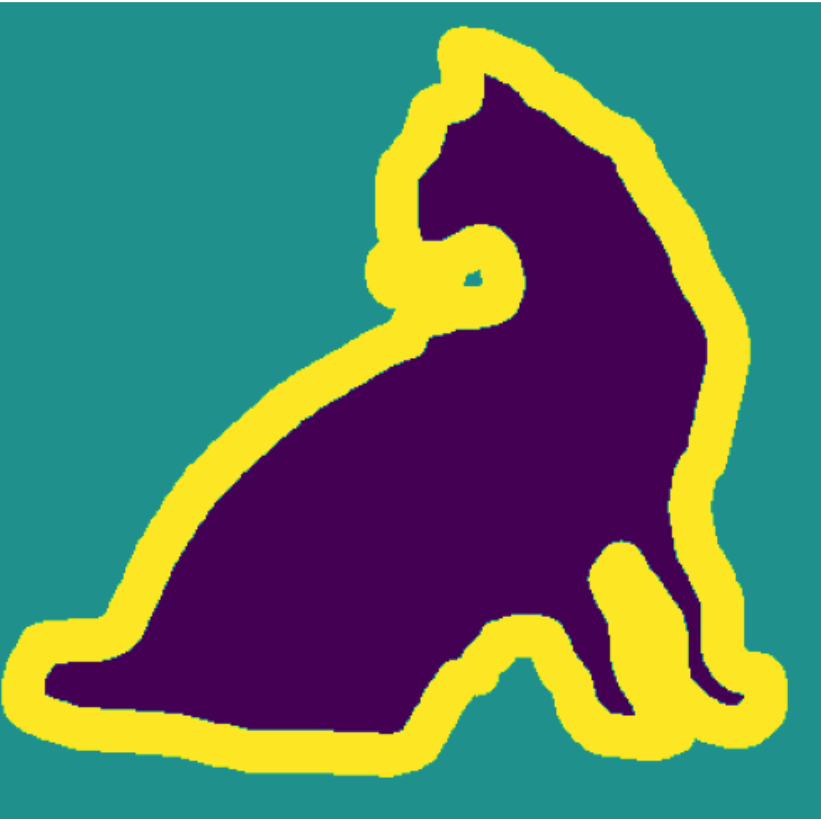

In [63]:
# Load mask image
mask = Image.open('Egyptian_Mau_123.png')
mask

In [64]:
# Transform mask to tensor
transform = transforms.Compose([transforms.ToTensor()])
mask_tensor = transform(mask)
mask_tensor


tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.2588, 0.2588, 0.2588,  ..., 0.2588, 0.2588, 0.2588],
         ...,
         [0.1255, 0.1255, 0.1255,  ..., 0.1255, 0.1255, 0.1255],
         [0.1255, 0.1255, 0.1255,  ..., 0.1255, 0.1255, 0.1255],
         [0.1255, 0.1255, 0.1255,  ..., 0.1255, 0.1255, 0.1255]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.6314, 0.6314, 0.6314,  ..., 0.6314, 0.6314, 0.6314],
         ...,
         [0.5647, 0.5647, 0.5647,  ..., 0.5647, 0.5647, 0.5647],
         [0.5647, 0.5647, 0.5647,  ..., 0.5647, 0.5647, 0.5647],
         [0.5647, 0.5647, 0.5647,  ..., 0.5647, 0.5647, 0.5647]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.6196, 0.6196, 0.6196,  ..., 0.6196, 0.6196, 0.

In [65]:
# Create binary mask
binary_mask = torch.where(
    mask_tensor == 1/255, 
    torch.tensor(1.0),
    torch.tensor(0.0),
)

# Print unique mask values
print(binary_mask.unique())
binary_mask

tensor([0., 1.])


tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 

Segmenting image with a mask

With the binary mask ready, you can use it to segment the object, that is the cat, out of the image.

To do so, you will need to load the original image and transform it to a tensor. Next, you will create the object tensor by masking the original image. Finally, you will display the result.

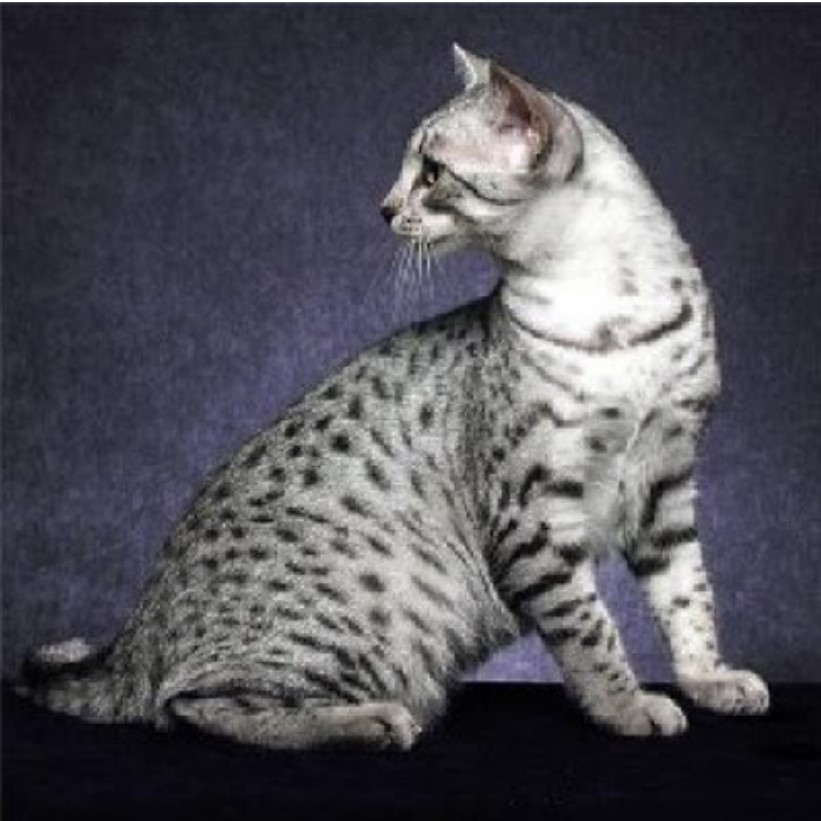

In [66]:
# Load image and transform to tensor
image = Image.open("Egyptian_Mau_123.jpg")
image

In [67]:
transform = transforms.Compose([transforms.ToTensor()])
image_tensor = transform(image)
image_tensor


tensor([[[0.9882, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.3647, 0.3490, 0.3333,  ..., 0.3059, 0.3059, 0.3059],
         ...,
         [0.0941, 0.0745, 0.0471,  ..., 0.0275, 0.0275, 0.0275],
         [0.0941, 0.0745, 0.0471,  ..., 0.0314, 0.0314, 0.0314],
         [0.0941, 0.0745, 0.0471,  ..., 0.0314, 0.0314, 0.0314]],

        [[0.9882, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 1.0000, 0.9961,  ..., 0.9961, 1.0000, 0.9961],
         [0.3608, 0.3451, 0.3294,  ..., 0.3020, 0.3020, 0.3020],
         ...,
         [0.0941, 0.0745, 0.0471,  ..., 0.0235, 0.0235, 0.0235],
         [0.0941, 0.0745, 0.0471,  ..., 0.0275, 0.0275, 0.0275],
         [0.0941, 0.0745, 0.0471,  ..., 0.0275, 0.0275, 0.0275]],

        [[0.9961, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.3843, 0.3647, 0.3529,  ..., 0.3255, 0.3216, 0.

In [68]:
print(image_tensor.shape)
print(binary_mask.shape)

torch.Size([3, 821, 821])
torch.Size([4, 819, 821])


In [69]:
import torch

# Resize the binary mask to match the height and width of the image tensor
binary_mask_resized = F_.interpolate(binary_mask.unsqueeze(0), size=image_tensor.shape[1:], mode='bilinear', align_corners=False).squeeze(0)

# Select the first 3 channels from the resized binary mask to match the image tensor's channels
binary_mask_resized = binary_mask_resized[:3]

binary_mask_resized.shape

torch.Size([3, 821, 821])

In [70]:
# Segment object out of the image
object_tensor = image_tensor * binary_mask_resized
object_tensor


tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])

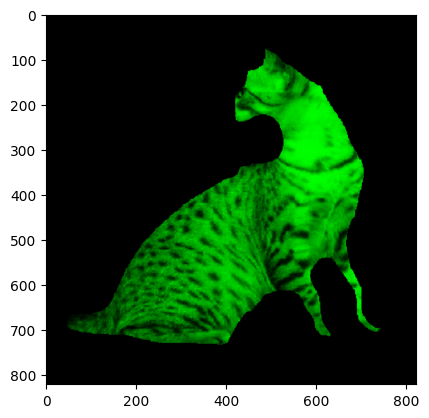

In [71]:
# Convert segmented object to image and display
to_pil_image = transforms.ToPILImage()
object_image = to_pil_image(object_tensor)
plt.imshow(object_image)
plt.show()

Segmenting with pre-trained Mask R-CNN

In this exercise, you will use the pre-trained Mask R-CNN model to perform instance segmentation on the following image of two cats.

The model you will use has been pre-trained on the COCO dataset, which contains images of common objects, including animals. Thanks to this, the model should be able to recognize cats out of the box, without the need to fine-tune it.

Your task is to load the model and the two cats image, prepare the image, and pass it to the model to obtain the predictions.

In [72]:
# Load a pre-trained Mask R-CNN model
model = maskrcnn_resnet50_fpn(pretrained=True)
model

C:\Users\Alienware\miniconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Alienware\miniconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

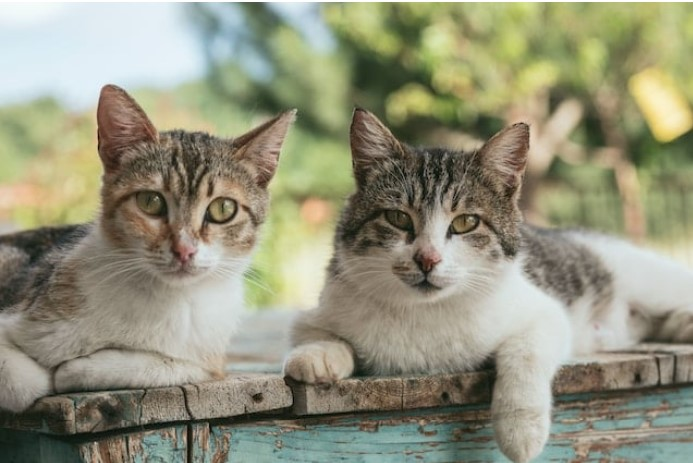

In [73]:
# Load an image and convert to a tensor
image = Image.open("two_cats.jpg")
image

In [74]:
transform = transforms.Compose([transforms.ToTensor()])
image_tensor = transform(image).unsqueeze(0)
print(image_tensor.shape)
image_tensor

torch.Size([1, 3, 463, 693])


tensor([[[[0.9961, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
          [0.9961, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 0.9961],
          [0.9686, 0.9686, 0.9686,  ..., 0.6510, 0.6431, 0.6392],
          ...,
          [0.0980, 0.0980, 0.0980,  ..., 0.5804, 0.5804, 0.5804],
          [0.0980, 0.0980, 0.1020,  ..., 0.5804, 0.5843, 0.5804],
          [0.0980, 0.0980, 0.1020,  ..., 0.5804, 0.5843, 0.5804]],

         [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [0.9725, 0.9725, 0.9725,  ..., 0.6784, 0.6745, 0.6667],
          ...,
          [0.1569, 0.1569, 0.1569,  ..., 0.7020, 0.7020, 0.7020],
          [0.1569, 0.1569, 0.1608,  ..., 0.7020, 0.7059, 0.7020],
          [0.1569, 0.1569, 0.1608,  ..., 0.7020, 0.7059, 0.7020]],

         [[1.0000, 1.0000, 1.0000,  ..., 0.9843, 0.9843, 0.9843],
          [1.0000, 1.0000, 1.0000,  ..., 0.9451, 0.9373, 0.9412],
          [0.9804, 0.9804, 0.9804,  ..., 0

In [75]:
model.eval()
# Perform inference
with torch.no_grad():
    prediction = model(image_tensor)
    print(prediction)

[{'boxes': tensor([[  3.8507,  82.3727, 298.9240, 403.0284],
        [270.6707, 109.0933, 692.3818, 448.7188],
        [  0.0000, 338.4226, 677.5331, 458.9690],
        [ 40.4159,  82.6848, 502.6591, 429.4307],
        [ 44.7994, 180.1852, 693.0000, 463.0000],
        [163.6122,   0.0000, 671.2651, 235.2549],
        [246.0782,  31.9488, 691.8430, 359.7962]]), 'labels': tensor([17, 17, 15, 17, 15, 64, 64]), 'scores': tensor([0.9967, 0.9952, 0.2413, 0.1249, 0.0932, 0.0689, 0.0656]), 'masks': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],


        [[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.00

In [76]:
len(prediction) # 1 because we made the prediction over 1 image

1

In [77]:
prediction[0]['boxes']

tensor([[  3.8507,  82.3727, 298.9240, 403.0284],
        [270.6707, 109.0933, 692.3818, 448.7188],
        [  0.0000, 338.4226, 677.5331, 458.9690],
        [ 40.4159,  82.6848, 502.6591, 429.4307],
        [ 44.7994, 180.1852, 693.0000, 463.0000],
        [163.6122,   0.0000, 671.2651, 235.2549],
        [246.0782,  31.9488, 691.8430, 359.7962]])

In [78]:
print(prediction[0]['scores'])
print(prediction[0]['labels'])

# The model is pretty certain that it has segmented two cats, each with a probability of more than 99%!

tensor([0.9967, 0.9952, 0.2413, 0.1249, 0.0932, 0.0689, 0.0656])
tensor([17, 17, 15, 17, 15, 64, 64])


Displaying soft masks

In the previous exercise, you have learned that the top two most likely objects the Mask R-CNN model has segmented are both cats. Now, you will display the masks for these two cats overlaid on top of the original image to visually verify their accuracy. This will require iterating over the two masks, and for each of them, plotting the original image followed by a semi-transparent mask on top of it.

In [79]:
# Extract masks and labels from prediction
masks = prediction[0]["masks"]
labels = prediction[0]["labels"]

masks[0, 0] # masks[0][0]

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [80]:
class_names = ['__background__',
 'person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'N/A',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'N/A',
 'backpack',
 'umbrella',
 'N/A',
 'N/A',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'N/A',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'N/A',
 'dining table',
 'N/A',
 'N/A',
 'toilet',
 'N/A',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'N/A',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

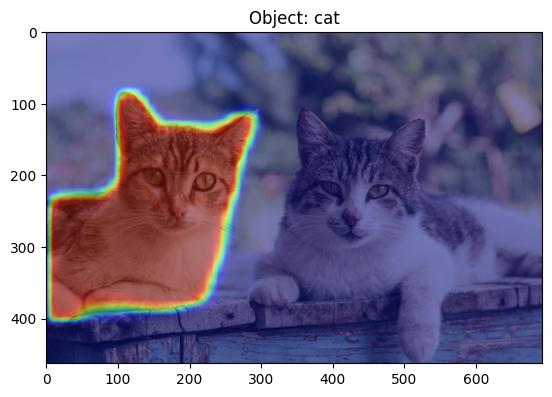

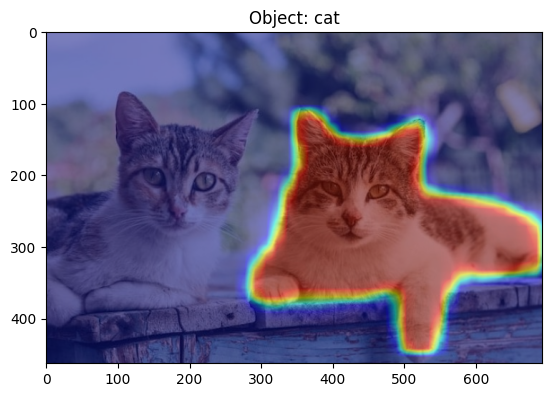

In [81]:
# Plot image with two overlaid masks
for i in range(2):
    plt.imshow(image)
    # Overlay the i-th mask on top of the image
    plt.imshow(masks[i,0], cmap='jet', alpha=0.5)
    plt.title(f"Object: {class_names[labels[i]]}")
    plt.show()

Building a U-Net: layers definitions

In this and the next exercise, you will construct a U-Net architecture from scratch. Here, you start with defining the __init__() method where you will define layers and blocks of layers for the model to use.

You need to pass the appropriate number of input and output channels to each of them, taking into account the skip connections.

The first block, dec1, will take as input the concatenation of upconv3 output with the enc3 output. The dec1 output, in turn, should be equal to enc3 output.

Building a U-Net: forward method

With the encoder and decoder layers defied, you can now implement the forward() method of the U-net.

The goal of the decoder is to upsample the feature maps so that its output is of the same height and width as the U-Net's input image. This will allow you to obtain pixel-level semantic masks.

UNet Class:

Purpose: The U-Net model segments images into two classes. For example, in a car image, it separates the car (Class 1) from the background (Class 2).

Key Components:

Encoder: Downsamples the image to extract features (using layers enc1, enc2, enc3, enc4).

Decoder: Upsamples the feature maps to reconstruct the image segmentation (using layers dec1, dec2, dec3).

Skip Connections: Connects corresponding encoder and decoder layers to retain spatial details.

Output Layer: Generates the segmentation mask.

Cropping Function: Ensures tensors have matching dimensions before concatenation.

In [82]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()

        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)

        self.dec1 = self.conv_block(512, 256)
        self.dec2 = self.conv_block(256, 128)
        self.dec3 = self.conv_block(128, 64)

        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def crop_tensor(self, tensor, target_tensor, tensor_name, target_tensor_name):
        _, _, h, w = tensor.size()
        target_h, target_w = target_tensor.size()[2:]
        print(f"Original tensor ({tensor_name}) shape: {tensor.shape}")
        print(f"Target tensor ({target_tensor_name}) shape: {target_tensor.shape}")
        print(f"Difference in height: {h - target_h}, Difference in width: {w - target_w}")

        # Calculate the start and end indices for cropping
        crop_start_h = max(0, (h - target_h) // 2)
        crop_end_h = crop_start_h + target_h if h > target_h else h
        crop_start_w = max(0, (w - target_w) // 2)
        crop_end_w = crop_start_w + target_w if w > target_w else w

        print(f"Cropping tensor ({tensor_name}): start_h={crop_start_h}, end_h={crop_end_h}, start_w={crop_start_w}, end_w={crop_end_w}")
        cropped_tensor = tensor[:, :, crop_start_h:crop_end_h, crop_start_w:crop_end_w]
        print(f"Cropped tensor ({tensor_name}) shape: {cropped_tensor.shape}")
        return cropped_tensor

    def forward(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(self.pool(x1))
        x3 = self.enc3(self.pool(x2))
        x4 = self.enc4(self.pool(x3))

        x = self.upconv3(x4)
        print('x', x.shape)  # Debug print
        print('x3', x3.shape)  # Debug print
        x3 = self.crop_tensor(x3, x, 'x3', 'x')
        print('x3 after crop', x3.shape)  # Debug print
        x = torch.cat([x, x3], dim=1)
        print('x after cat', x.shape)  # Debug print
        x = self.dec1(x)

        x = self.upconv2(x)
        x2 = self.crop_tensor(x2, x, 'x2', 'x')
        x = torch.cat([x, x2], dim=1)
        x = self.dec2(x)

        x = self.upconv1(x)
        x1 = self.crop_tensor(x1, x, 'x1', 'x')
        x = torch.cat([x, x1], dim=1)
        x = self.dec3(x)

        return self.out(x)

# Instantiate the model
model = UNet(in_channels=3, out_channels=2)

# Print the model to verify
print(model)


UNet(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): Ba

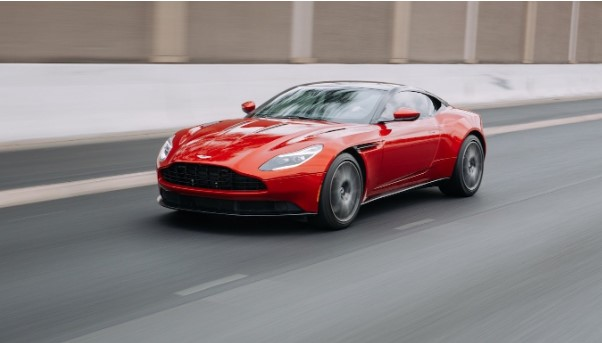

In [83]:
# Load and transform image
image = Image.open('car.jpg')
image

In [84]:
transform = transforms.Compose([transforms.ToTensor()])
image_tensor = transform(image).unsqueeze(0)
image_tensor.shape

torch.Size([1, 3, 343, 602])

In [85]:
model.eval()

# Predict segmentation mask
with torch.no_grad():
    prediction = model(image_tensor).squeeze(0)

print(prediction.shape)
prediction

x torch.Size([1, 256, 84, 150])
x3 torch.Size([1, 256, 85, 150])
Original tensor (x3) shape: torch.Size([1, 256, 85, 150])
Target tensor (x) shape: torch.Size([1, 256, 84, 150])
Difference in height: 1, Difference in width: 0
Cropping tensor (x3): start_h=0, end_h=84, start_w=0, end_w=150
Cropped tensor (x3) shape: torch.Size([1, 256, 84, 150])
x3 after crop torch.Size([1, 256, 84, 150])
x after cat torch.Size([1, 512, 84, 150])
Original tensor (x2) shape: torch.Size([1, 128, 171, 301])
Target tensor (x) shape: torch.Size([1, 128, 168, 300])
Difference in height: 3, Difference in width: 1
Cropping tensor (x2): start_h=1, end_h=169, start_w=0, end_w=300
Cropped tensor (x2) shape: torch.Size([1, 128, 168, 300])
Original tensor (x1) shape: torch.Size([1, 64, 343, 602])
Target tensor (x) shape: torch.Size([1, 64, 336, 600])
Difference in height: 7, Difference in width: 2
Cropping tensor (x1): start_h=3, end_h=339, start_w=1, end_w=601
Cropped tensor (x1) shape: torch.Size([1, 64, 336, 600]

tensor([[[ 0.1197,  0.1212,  0.1204,  ...,  0.1205,  0.1199,  0.1184],
         [ 0.1142,  0.1158,  0.1143,  ...,  0.1150,  0.1153,  0.1169],
         [ 0.1128,  0.1134,  0.1105,  ...,  0.1113,  0.1111,  0.1144],
         ...,
         [ 0.1144,  0.1148,  0.1125,  ...,  0.1106,  0.1099,  0.1145],
         [ 0.1150,  0.1138,  0.1121,  ...,  0.1098,  0.1068,  0.1133],
         [ 0.1161,  0.1149,  0.1135,  ...,  0.1114,  0.1089,  0.1137]],

        [[-0.0168, -0.0169, -0.0160,  ..., -0.0153, -0.0154, -0.0192],
         [-0.0193, -0.0227, -0.0224,  ..., -0.0215, -0.0213, -0.0235],
         [-0.0176, -0.0220, -0.0216,  ..., -0.0219, -0.0230, -0.0230],
         ...,
         [-0.0181, -0.0214, -0.0212,  ..., -0.0225, -0.0246, -0.0239],
         [-0.0198, -0.0226, -0.0220,  ..., -0.0246, -0.0263, -0.0235],
         [-0.0176, -0.0191, -0.0190,  ..., -0.0187, -0.0199, -0.0205]]])

The U-Net model you’ve built is not pretrained. 

This means it starts with random weights and hasn't learned any specific features from images yet.

Non-pretrained Model: Outputs visual patterns based on random weights, not meaningful.

Pretrained Model: Provides accurate segmentation by leveraging learned features from extensive training.

By using a pretrained U-Net model, you can produce accurate segmentation masks for images, such as identifying and segmenting a car from its background.

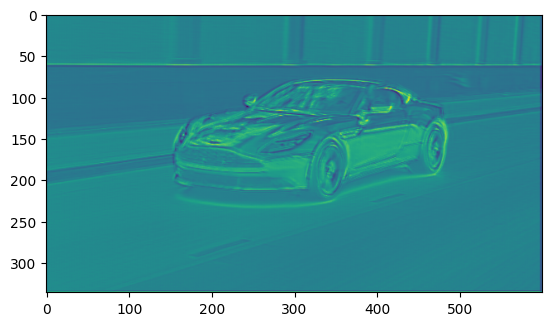

In [86]:
# Display mask
plt.imshow(prediction[1, :, :])
plt.show()

In [87]:
# # USING A PRE TRAINED UNET with 3 output classes


# # Define the URL for the pretrained weights
# checkpoint_url = 'https://github.com/milesial/Pytorch-UNet/releases/download/v3.0/unet_carvana_scale0.5_epoch2.pth'

# # Load the pretrained weights with CPU mapping
# state_dict = torch.hub.load_state_dict_from_url(checkpoint_url, map_location=torch.device('cpu'))

# # Load the U-Net model architecture from the repository
# model = torch.hub.load('milesial/Pytorch-UNet', 'unet_carvana', pretrained=False)

# # Modify the final layer to have 3 output classes
# model.out = nn.Conv2d(64, 3, kernel_size=1)  # Change the output channels to 3

# # Apply the pretrained weights to the modified model (ignore missing keys due to different output size)
# model.load_state_dict(state_dict, strict=False)
# model.to(torch.device('cpu'))  # Ensure the model is on the CPU
# model.eval()  # Set the model to evaluation mode


# # Predict segmentation mask
# with torch.no_grad():
#     prediction = model(image_tensor).squeeze(0)

# prediction


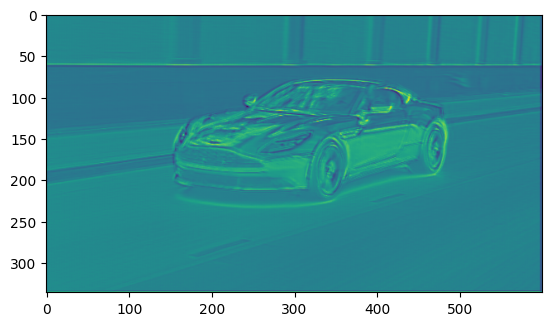

In [88]:
# Display mask
plt.imshow(prediction[1, :, :])
plt.show()

Setup up semantic masks

A common way to perform panoptic segmentation is to combine together the outputs of semantic and instance segmentation. Consider the following image of a New York street.

Your task is to segment it panoptically, such that each cab is identified as a separate object, while distinguishing between the asphalt and building backgrounds.

To achieve it, you will start by producing a semantic mask with a pre-trained U-Net, available to you as UNet(). Hopefully, it should distinguish between the two background types (but not between particular cabs)!

In [89]:

# Define a modified U-Net class to have 3 output classes and handle cropping

# USING the below defined above UNet3Class, instantiating it with 3 output classes (for the cars, the pavement and the backgroud) and load the pretrained imported weights

class UNet3Class(nn.Module):
    def __init__(self, in_channels, out_channels=3):
        super(UNet3Class, self).__init__()
        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(512, 256)
        self.dec2 = self.conv_block(256, 128)
        self.dec3 = self.conv_block(128, 64)
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def crop_tensor(self, tensor, target_tensor):
        _, _, h, w = tensor.size()
        target_h, target_w = target_tensor.size()[2:]
        diff_h = (h - target_h) // 2
        diff_w = (w - target_w) // 2
        return tensor[:, :, diff_h:(diff_h + target_h), diff_w:(diff_w + target_w)]

    def forward(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(self.pool(x1))
        x3 = self.enc3(self.pool(x2))
        x4 = self.enc4(self.pool(x3))
        
        x = self.upconv3(x4)
        x = torch.cat([x, self.crop_tensor(x3, x)], dim=1)
        x = self.dec1(x)
        
        x = self.upconv2(x)
        x = torch.cat([x, self.crop_tensor(x2, x)], dim=1)
        x = self.dec2(x)
        
        x = self.upconv1(x)
        x = torch.cat([x, self.crop_tensor(x1, x)], dim=1)
        x = self.dec3(x)
        
        return self.out(x)


In [90]:
# Load the pretrained weights with CPU mapping
checkpoint_url = 'https://github.com/milesial/Pytorch-UNet/releases/download/v3.0/unet_carvana_scale0.5_epoch2.pth'
state_dict = torch.hub.load_state_dict_from_url(checkpoint_url, map_location=torch.device('cpu'))

# Instantiate the modified U-Net model with 3 output classes
model = UNet3Class(in_channels=3, out_channels=3)

# Load the pretrained weights to the modified model (ignore mismatched keys)
model.load_state_dict(state_dict, strict=False)
model.to(torch.device('cpu'))  # Ensure the model is on CPU
model.eval()  # Set the model to evaluation mode

UNet3Class(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (

In [91]:
weights = DeepLabV3_ResNet101_Weights.DEFAULT
model = deeplabv3_resnet101(weights=weights)
model.classifier[4] = torch.nn.Conv2d(256, 3, kernel_size=(1, 1), stride=(1, 1)) # Adjust final layer to 3 classes
model.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

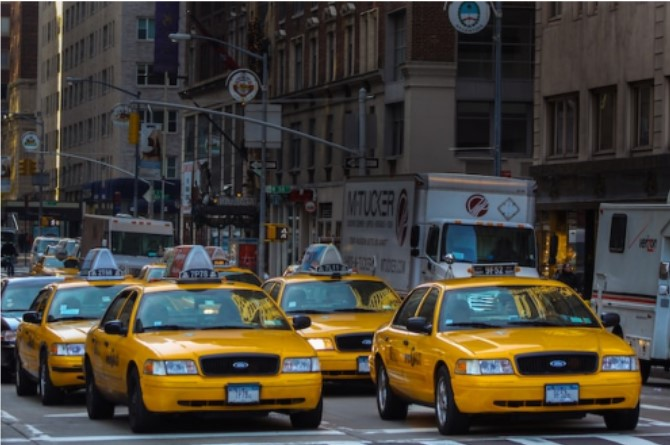

In [92]:
# Load and preprocess the input image
image = Image.open('taxis.jpg')
image

In [93]:
transform = transforms.Compose([
    transforms.Resize((448, 672)),  # Pad to the required dimensions
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
image_tensor = transform(image).unsqueeze(0)
image_tensor.shape


torch.Size([1, 3, 448, 672])

In [94]:
# Produce semantic masks for the input image
with torch.no_grad():
    semantic_masks = model(image_tensor) #.squeeze(0)

# print(semantic_masks.shape)

semantic_masks

OrderedDict([('out',
              tensor([[[[ 0.1357,  0.1357,  0.1357,  ...,  0.2014,  0.2014,  0.2014],
                        [ 0.1357,  0.1357,  0.1357,  ...,  0.2014,  0.2014,  0.2014],
                        [ 0.1357,  0.1357,  0.1357,  ...,  0.2014,  0.2014,  0.2014],
                        ...,
                        [-0.1362, -0.1362, -0.1362,  ..., -0.0980, -0.0980, -0.0980],
                        [-0.1362, -0.1362, -0.1362,  ..., -0.0980, -0.0980, -0.0980],
                        [-0.1362, -0.1362, -0.1362,  ..., -0.0980, -0.0980, -0.0980]],
              
                       [[ 0.0165,  0.0165,  0.0165,  ...,  0.0781,  0.0781,  0.0781],
                        [ 0.0165,  0.0165,  0.0165,  ...,  0.0781,  0.0781,  0.0781],
                        [ 0.0165,  0.0165,  0.0165,  ...,  0.0781,  0.0781,  0.0781],
                        ...,
                        [-0.1072, -0.1072, -0.1072,  ..., -0.0507, -0.0507, -0.0507],
                        [-0.1072, -0.1072, -0

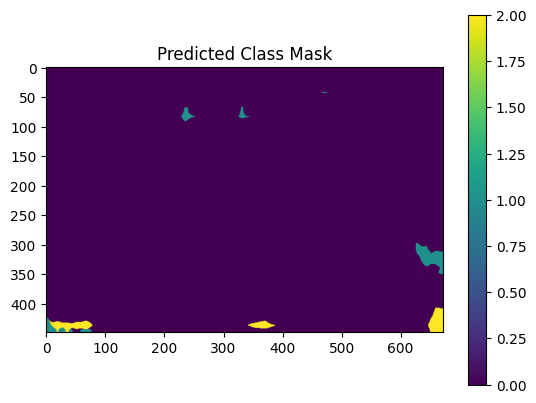

In [95]:
# Extract the 'out' tensor from the OrderedDict
output = semantic_masks['out']

# Get the predicted class for each pixel
semantic_mask = torch.argmax(output, dim=1).squeeze(0)

# Visualize the predicted class mask
plt.imshow(semantic_mask.cpu(), cmap='viridis')  # Ensure tensor is on CPU
plt.colorbar()
plt.title('Predicted Class Mask')
plt.show()


Overlay instance masks

As we don't have a properly pretrained model, the three classes are not well distinguished.

Now, you can overwrite it with instance masks in the locations where the objects have been identified by the instance segmentation model.

You will use the pre-trained MaskRCNN available in your workspace to produce instance segmentation masks. Then, you will loop over these masks and for each of them, you will overlay the parts where an object is detected with high certainty on top of the semantic mask.

In [96]:
# Instantiate model and produce instance masks
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [97]:
with torch.no_grad():
    instance_masks = model(image_tensor)[0]["masks"]

print(len(instance_masks))
instance_masks

26


tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0.

In [98]:
# Initialize panoptic mask as semantic_mask
panoptic_mask = torch.clone(semantic_mask).unsqueeze(0)

print(panoptic_mask.shape)
panoptic_mask

torch.Size([1, 448, 672])


tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [1, 1, 1,  ..., 2, 2, 2],
         [1, 1, 1,  ..., 2, 2, 2],
         [1, 1, 1,  ..., 2, 2, 2]]])

In [99]:
# Iterate over instance masks
instance_id = 3
for mask in instance_masks:
    # Set panoptic mask to instance_id where mask > 0.5
    panoptic_mask[mask > 0.5] = instance_id
    instance_id += 1
    
print(panoptic_mask.shape)
panoptic_mask

torch.Size([1, 448, 672])


tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [1, 1, 1,  ..., 2, 2, 2],
         [1, 1, 1,  ..., 2, 2, 2],
         [1, 1, 1,  ..., 2, 2, 2]]])

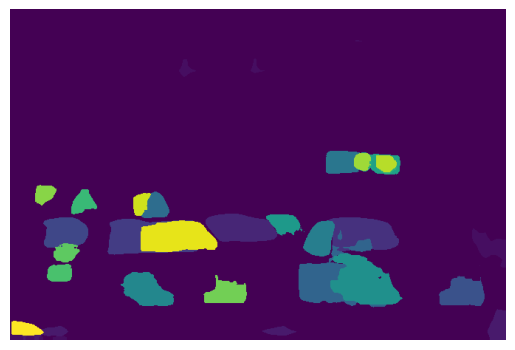

In [100]:
# Display panoptic mask
plt.imshow(panoptic_mask.squeeze(0))
plt.axis("off")
plt.show()

# Now you can combine semantic and instance segmentation outputs to produce panoptic masks! 
# Notice how each cab and even is segmented as a separate object, while the buildings background is distinguished from the street.

Generator

A GAN generator takes a random noise vector as input and produces a generated image. To make its architecture more reusable, you will pass both input and output shapes as parameters to the model. This way, you can use the same model with different sizes of input noise and images of varying shapes.

In [101]:
def gen_block(in_dim, out_dim):
    return nn.Sequential(
        nn.Linear(in_dim, out_dim),
        nn.BatchNorm1d(out_dim),
        nn.ReLU(inplace=True)
    )

In [102]:
class Generator(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(Generator, self).__init__()
        # Define generator block
        self.generator = nn.Sequential(
            gen_block(in_dim, 256),
            gen_block(256, 512),
            gen_block(512, 1024),
          	# Add linear layer
            gen_block(1024, out_dim),
            # Add activation
            nn.Sigmoid()
        )

    def forward(self, x):
      	# Pass input through generator
        return self.generator(x)

Discriminator

With the generator defined, the next step in building a GAN is to construct the discriminator. It takes the generator's output as input, and produces a binary prediction: is the input generated or real?

In [103]:
def disc_block(in_dim, out_dim):
    return nn.Sequential(
        nn.Linear(in_dim, out_dim),
        nn.LeakyReLU(0.2)
    )

In [104]:
class Discriminator(nn.Module):
    def __init__(self, im_dim):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            disc_block(im_dim, 1024),
            disc_block(1024, 512),
            # Define last discriminator block
            disc_block(512, 256),
            # Add a linear layer
            nn.Linear(256, 1),
        )

    def forward(self, x):
        # Define the forward method
        self.disc(x)

Convolutional Generator

Define a convolutional generator following the DCGAN guidelines

In [105]:
def dc_gen_block(in_dim, out_dim, kernel_size, stride):
    return nn.Sequential(
        nn.ConvTranspose2d(in_dim, out_dim, kernel_size, stride=stride),
        nn.BatchNorm2d(out_dim),
        nn.ReLU()
    )

In [106]:
class DCGenerator(nn.Module):
    def __init__(self, in_dim, kernel_size=4, stride=2):
        super(DCGenerator, self).__init__()
        self.in_dim = in_dim
        self.gen = nn.Sequential(
            dc_gen_block(in_dim, 1024, kernel_size, stride),
            dc_gen_block(1024, 512, kernel_size, stride),
            # Add last generator block
            dc_gen_block(512, 256, kernel_size, stride),
            # Add transposed convolution
            nn.ConvTranspose2d(256, 3, kernel_size, stride=stride),
            # Add Tanh activation
            nn.Tanh()
        )

    def forward(self, x):
        x = x.view(len(x), self.in_dim, 1, 1)
        return self.gen(x)

Convolutional Discriminator

With the DCGAN's generator ready, the last step before you can proceed to training it is to define the convolutional discriminator.

In [107]:
def dc_disc_block(in_dim, out_dim, kernel_size, stride):
    return nn.Sequential(
        nn.Conv2d(in_dim, out_dim, kernel_size, stride=stride),
        nn.BatchNorm2d(out_dim),
        nn.LeakyReLU(0.2),
    )

In [108]:
class DCDiscriminator(nn.Module):
    def __init__(self, kernel_size=4, stride=2):
        super(DCDiscriminator, self).__init__()
        self.disc = nn.Sequential(
          	# Add first discriminator block
            dc_disc_block(3, 512, kernel_size, stride),
            dc_disc_block(512, 1024, kernel_size, stride),
          	# Add a convolution
            nn.Conv2d(1024, 1, kernel_size, stride=stride),
        )

    def forward(self, x):
        # Pass input through sequential block
        x = self.disc(x)
        return x.view(len(x), -1)

Generator loss

Before you can train your GAN, you need to define loss functions for both the generator and the discriminator. You will start with the former.

Recall that the generator's job is to produce such fake images that would fool the discriminator into classifying them as real. Therefore, the generator incurs a loss if the images it generated are classified by the discriminator as fake (label 0).

Define the gen_loss() function that calculates the generator loss. It takes four arguments:

gen, the generator model

disc, the discriminator model

num_images, the number of images in batch

z_dim, the size of the input random noise

In [109]:
criterion = nn.BCEWithLogitsLoss()

In [110]:

def gen_loss(gen, disc, num_images, z_dim):
    # Generate fake images
    noise = torch.randn(num_images, z_dim, 1, 1, device=disc.parameters().__next__().device)
    fake = gen(noise)
    # Get discriminator's predictions for fake images
    disc_pred_fake = disc(fake)
    # Calculate the generator loss (aim is to fool the discriminator)
    loss = criterion(disc_pred_fake, torch.ones_like(disc_pred_fake))
    return loss


Discriminator loss

It's time to define the loss for the discriminator. Recall that the discriminator's job is to classify images either real or fake. Therefore, the generator incurs a loss if it classifies generator's outputs as real (label 1) or the real images as fake (label 0).

Define the disc_loss() function that calculates the discriminator loss. It takes five arguments:

gen, the generator model

disc, the discriminator model

real, a sample of real images from the training data

num_images, the number of images in batch

z_dim, the size of the input random noise

In [111]:

def disc_loss(gen, disc, real, num_images, z_dim):
    # Generate fake images
    noise = torch.randn(num_images, z_dim, 1, 1, device=real.device)
    fake = gen(noise)
    # Get discriminator's predictions for fake images
    disc_pred_fake = disc(fake)
    # Calculate the fake loss component
    fake_loss = criterion(disc_pred_fake, torch.zeros_like(disc_pred_fake))
    # Get discriminator's predictions for real images
    disc_pred_real = disc(real)
    # Calculate the real loss component
    real_loss = criterion(disc_pred_real, torch.ones_like(disc_pred_real))
    # Combine the fake and real loss
    total_loss = (fake_loss + real_loss) / 2
    return total_loss


Training loop

Finally, all the hard work you put into defining the model architectures and loss functions comes to fruition: it's training time! Your job is to implement and execute the GAN training loop. Note: a break statement is placed after the first batch of data to avoid a long runtime.

The two optimizers, disc_opt and gen_opt, have been initialized as Adam() optimizers.

In [112]:
disc_opt = Adam(
    params=model.parameters(),
    lr=0.0001,
    betas=(0.9, 0.999),
    eps=1e-08,
    weight_decay=0,
    amsgrad=False,
    foreach=None,
    fused=None,
    capturable=False,
    maximize=False,
    differentiable=False
)

disc_opt


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)

In [113]:
gen_opt = Adam(
    params=model.parameters(),
    lr=0.0002,
    betas=(0.9, 0.999),
    eps=1e-08,
    weight_decay=0,
    amsgrad=False,
    foreach=None,
    fused=None,
    capturable=False,
    maximize=False,
    differentiable=False
)

gen_opt


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0002
    maximize: False
    weight_decay: 0
)

In [114]:
gen = DCGenerator(in_dim = 16)
gen

DCGenerator(
  (gen): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(16, 1024, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): ConvTranspose2d(256, 3, kernel_size=(4, 4), stride=(2, 2))
    (4): Tanh()
  )
)

In [115]:
disc = DCDiscriminator()
disc

DCDiscriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 512, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (2): Conv2d(1024, 1, kernel_size=(4, 4), stride=(2, 2))
  )
)

In [116]:
cur_batch_size = 32

In [117]:
# Create a dummy dataset with random tensors mimicking real images
batch_size = 32
image_size = (3, 64, 64)  # Example image size (channels, height, width)
dummy_data = torch.randn(batch_size, *image_size)

# Create a DataLoader with the dummy dataset
dummy_dataset = TensorDataset(dummy_data)
dataloader = DataLoader(dummy_dataset, batch_size=batch_size, shuffle=True)
dataloader

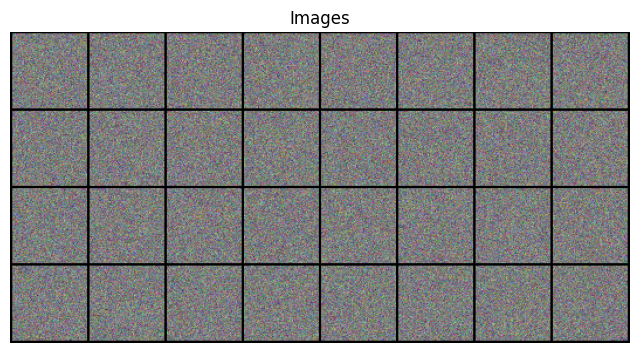

In [118]:
# Function to show an image
def show_images(images, nrow=8):
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title("Images")
    grid = vutils.make_grid(images, nrow=nrow, normalize=True)
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.show()

# Assuming you have a DataLoader with the name 'dataloader'
data_iter = iter(dataloader)
real_images, = next(data_iter)

# Plot the images
show_images(real_images)


In [119]:
# now let's use real cats images

# Define a transform to preprocess the images
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize images to 64x64
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize images to [-1, 1]
])

# Load the dataset (replace 'path_to_dataset' with the actual path)
dataset = datasets.ImageFolder(root=r'C:\Users\Alienware\Documents\INGEGNERIA\Data Science PC\BACKUP\Python\more\Deep Learning\Cats&Dogs Dataset\PetImages', transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=4)
dataloader

In [120]:
# Calculate the number of iterations (batches) per epoch
total_images = len(dataset)
batch_size = 32  # Example batch size
num_iterations = total_images // batch_size

print(f"Total number of images: {total_images}")
print(f"Batch size: {batch_size}")
print(f"Estimated number of iterations per epoch: {num_iterations}")


Total number of images: 24970
Batch size: 32
Estimated number of iterations per epoch: 780


In [121]:
# Training loop
for epoch in range(1):
    counter = 0
    for real in dataloader:
        real_images = real[0]  # Extract images from the dataloader output
        cur_batch_size = len(real_images)
        
        disc_opt.zero_grad()
        # Calculate discriminator loss
        disc_loss_value = disc_loss(gen, disc, real_images, cur_batch_size, z_dim=16)
        # Compute discriminator gradients 
        disc_loss_value.backward()
        disc_opt.step()

        gen_opt.zero_grad()
        # Calculate generator loss
        gen_loss_value = gen_loss(gen, disc, cur_batch_size, z_dim=16)
        # Compute generator gradients
        gen_loss_value.backward()
        gen_opt.step()

        print(f"Generator loss: {gen_loss_value}")
        print(f"Discriminator loss: {disc_loss_value}")

        counter += 1

        if counter == 2:
            break


Generator loss: 0.693657636642456
Discriminator loss: 0.7016136646270752
Generator loss: 0.7018962502479553
Discriminator loss: 0.700777530670166


Generating images

Now that you have designed and trained your GAN, it's time to evaluate the quality of the images it can generate. For a start, you will perform a visual inspection. To do this, you will create random noise as input for the generator, pass it to the model and plot the outputs.

In [122]:
num_images_to_generate = 3
# Create random noise tensor
noise = torch.randn(num_images_to_generate, 16)

noise

tensor([[ 0.0570,  2.4439,  0.6698, -1.5707,  0.4636,  1.3753, -1.0370, -1.2809,
         -0.2917,  0.9534,  0.5463,  0.5631,  0.3065, -0.3752, -1.6015, -0.7734],
        [-0.2606, -0.0662, -1.0231,  0.4434, -1.6297, -0.9081, -0.3481,  0.3154,
          0.1324,  0.5311, -0.7654, -0.5977,  0.2836,  0.5446,  0.3290, -0.2381],
        [ 1.5127,  2.0115,  0.7795,  0.1713,  0.1493,  0.4255,  0.3174,  0.9676,
         -1.4044,  0.8136, -1.4579, -0.4514, -0.2282, -0.3386, -1.3711, -0.0349]])

In [123]:
# Generate images
with torch.no_grad():
    fake = gen(noise)
print(f"Generated tensor shape: {fake.shape}")

Generated tensor shape: torch.Size([3, 3, 46, 46])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999999..1.0].


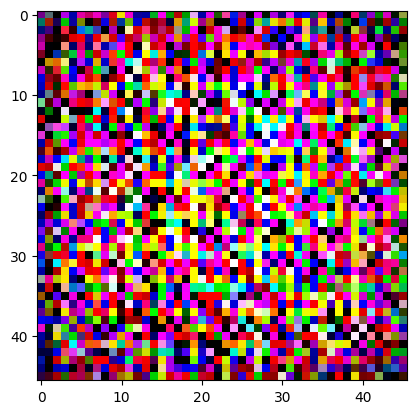

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99987376..0.9999978].


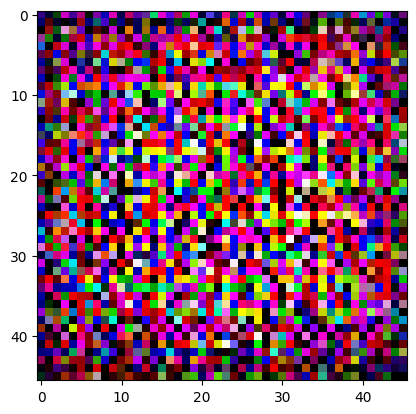

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99999976..1.0].


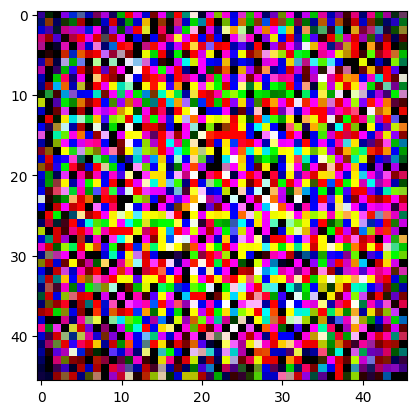

In [124]:
for i in range(num_images_to_generate):
    # Slice fake to select i-th image
    image_tensor = fake[i, :, :, :]
    # Permute the image dimensions
    image_tensor_permuted = image_tensor.permute(1, 2, 0) #  Permute image_tensor's dimensions from (color, height, width) to (hight, width, color) and assign the output to image_tensor_permuted.
    plt.imshow(image_tensor_permuted)
    plt.show()

Fréchet Inception Distance

The visual inspection of generated images is a great start. But given they look okay, a more precise, quantitative evaluation will be helpful to understand the generator's performance. You will evaluate your GAN using the Fréchet Inception Distance, or FID.

In [127]:
# Instantiate FID
fid = FrechetInceptionDistance(feature=64)

# Assuming `real` and `fake` are the batches of images from your DataLoader and generator respectively
# Extract the image tensor from the list
real_images = real[0]

# Update FID with fake and real images
fid.update((fake * 255).to(torch.uint8), real=False)
fid.update((real_images * 255).to(torch.uint8), real=True)

# Compute the metric
fid_score = fid.compute()
print(fid_score)


tensor(87.0755)
